# SOTA -  ACE Algorithms

The main goal of this lab is to review the state of the art of some audio chord estimation algorithms and evaluate them.

To run this notebook, you should have installed the following libraries:
    - Essentia library (https://essentia.upf.edu/documentation/installing.html)
    - Madmom library (https://madmom.readthedocs.io/en/latest/installation.html)
    - Mir-eval library (https://pypi.org/project/mir_eval/)
    - pygments library (https://pypi.org/project/Pygments/)
    - some common scientific libraries: numpy, ipython, matplotlib, cython.
    
Some folders and directories are created in order to organize the files we create in the process. This directories can be changed in the running feature extraction and running mireval sections, but remember to create the folders:
    - soundsDir ('sounds/' by default): directory for the audio dataset (already provided)
    - outputDir= ('outputFiles/' by default): directory for some low-level descriptors (created during feature extraction)
    - predictDir = ('annotations/predicted/' by default): directory for predictions of the algorithms in .lab format (created during feature extraction) 
    - refDir=('annotations/reference/' by default): directory for reference annotations in .lab format (already provided)
    - evalDir=('annotations/evaluation/' by default): directory for individual scores of the evaluation in .json format(created during mir evaluation)
    
  
The running procedure may take a few hours.

### Victor Nuñez Tarifa 

#### Initialization of variables and functions

In [3]:
import os
import sys
import pickle
import numpy as np
import essentia.standard as ess
import matplotlib.pyplot as plt
import json
import madmom.features.chords as mdm

%matplotlib inline
import warnings
warnings.filterwarnings('ignore')
import IPython.display as ipd
from IPython.core.display import HTML
from pygments import highlight
from pygments.lexers import JavascriptLexer
from pygments.formatters import HtmlFormatter

#Container for analysis parameters
class AnalysisParams:
    def __init__(self,windowSize,hopSize,windowFunction,fftN,fs):
        '''
        windowSize: milliseconds,
        hopSize: milliseconds,
        windowFunction: str ('blackman','hanning',...)
        fftN: int
        '''
        self.windowSize = windowSize
        self.hopSize = hopSize
        self.windowFunction = windowFunction
        self.fftN=fftN
        self.fs=fs


def initiateData4File(file):
    '''Forming the data structure for file
    Parameters
    ----------
    file,root : str
        File name and path info
    
    Returns
    -------
    fileData : dict
        Dictionary containing all info and data for the file
    ''' 
    fileData=dict();fileData['name']=file;
    #Low level(LL) features
    fileData['NRG']=[];fileData['zcr']=[];#time domain features
    fileData['specCentroid']=[];fileData['specFlatness']=[]; fileData['hpcp']=[]; fileData['tuning']=[] #frequency domain features
    
    return fileData


def initiateChord4File(file):
    
    chordData=dict();chordData['name']=file;
    #Chords
    chordData['chords']=[]
    chordData['stamps']=[]
    
    return chordData


def createName(file, filetype):
    '''Modify the file name string
    Parameters
    -----------
    file: str
        Path of the file name
    Returns
    -----------'''
    name=file.split('-')[2]
    name=name.replace(filetype,'')
    name=name.lstrip(" ")
    name=name.lower()
    name=name.replace('_','')
    name = name.replace(name[name.find("["):name.find("]")+1], "") 
    name = name.replace(name[name.find("("):name.find(")")+1], "")
    name=name.rstrip(" ")
    name="".join(name.split("."))
    name="".join(name.split(","))
    name="_".join(name.split(" "))
    name=name.replace('__','_and_')
    
    return name


def previewJSONFile(jsonFile):
    ''' Generate fine preview of JSON
     Parameters
    ----------
    jsonFile : str
        JSON file name
    Returns
    -------
    preview: str
    '''   

    with open(jsonFile) as f:
        code = f.read()
    formatter = HtmlFormatter()
    return '<style type="text/css">{}</style>{}'.format(
        formatter.get_style_defs('.highlight'),
        highlight(code, JavascriptLexer(), formatter))


def createLabs(labsData):
    '''Create .lab files compatible with mir-eval library
    Parameters
    ----------
    labsData: dict
        Dictionary containing all info and data for the file
    Returns
    ---------
    zipper: tuple
        startTime, endTime and chords joined
    '''
    
    
    startTime = labsData['stamps']
    endTime = labsData['stamps'][1:]
    chords = labsData['chords']

    chords = [chord.replace('m', ':min') for chord in chords]
        
    zipper = zip(startTime, endTime, chords)
    
    return zipper


def createLabsBeats(labsDataBeats,duration):
    '''Create .lab files compatible with mir-eval library
    Parameters
    ----------
    labsData: dict
        Dictionary containing all info and data for the file
    Returns
    ---------
    zipper: tuple
        startTime, endTime and chords joined
    '''
    
    beats = labsDataBeats['stamps']
    beats = np.insert(beats, 0, 0, axis=0)
    beats = np.append(beats,duration)
    startTime = beats
    endTime = beats[1:]
    chords = labsDataBeats['chords']
    chords = np.insert(chords,0,'N',axis=0)
    chords = np.append(chords,'N')

    chords = [chord.replace('m', ':min') for chord in chords]
        
    zipperBeats = zip(startTime, endTime, chords)
    
    return zipperBeats


def emptyChords(hpcp,chords):
    '''Find hpcp's with all values at 0, and replace the chord with an 'N', as MIREX rules recommend
    Parameters
    ----------
    hpcp: np.array
        List containing lists of pitch class profile values
    chords: list
        List of chord labels
    Returns
    ---------
    chords: list
        Modified chords
    '''
    
    counter = []

    for count, pcp in enumerate(hpcp):
        if(np.all(pcp)==0.):
            counter.append(count)

    for (count, chord) in zip(counter, chords):
        chords[count] = 'N'
        
    return chords



#### Define features extraction functions

In [2]:
def averageTuning(filepath,params):
    '''Computation of the average tuning
    Parameters
    ----------
    filepath : str
        the path and name of the file
    params : instance of AnalysisParams
        Analysis parameters
    Returns
    ---------
    averageTuning : float
        average tuning value'''
    
    #Reading the wave file
    fs=params.fs
    #x = ess.MonoLoader(filename = os.path.join(fileData['path'], fileData['name']), sampleRate = fs)()
    x=ess.MonoLoader(filename=filepath, sampleRate=fs)()

    #Windowing (in samples)
    windowSize=params.windowSize; windowSize=int(windowSize/2)*2 #assuring window size is even 
    hopSize=params.hopSize;hopSize=int(hopSize/2)*2 #assuring hopSize is even
    
    #Initializing lists for features
    tuningFreq=[];
    
    #Main windowing and feature extraction loop
    for frame in ess.FrameGenerator(x, frameSize=windowSize, hopSize=hopSize, startFromZero=True):
        frame=ess.Windowing(size=windowSize, type=params.windowFunction)(frame)
        mX = ess.Spectrum(size=windowSize)(frame)
        mX[mX<np.finfo(float).eps]=np.finfo(float).eps
        freq,mag = ess.SpectralPeaks(magnitudeThreshold=1e-05,
                                     minFrequency=40,
                                     maxPeaks=10000,
                                     orderBy='magnitude')(mX) #extract frequency and magnitude information by finding the spectral peaks
        tuneFrame, _ = ess.TuningFrequency()(freq,mag)
        tuningFreq.append(tuneFrame)

    averageTuning = np.average(tuningFreq)
    
    return averageTuning
    
    
def computeLLFeatures(fileData,params,filepath):
    '''Computation of the low-level features
    Parameters
    ----------
    fileData : dict
        Dictionary containing all info and data for the file
    params : instance of AnalysisParams
        Analysis parameters
    filepath: str
        the path and name of the file
    Modifies
    -------
    fileData 
    '''
    #Reading the wave file
    fs=params.fs
    #x = ess.MonoLoader(filename = os.path.join(fileData['path'], fileData['name']), sampleRate = fs)()
    x=ess.MonoLoader(filename=filepath, sampleRate=fs)()

    #Windowing (in samples)
    windowSize=params.windowSize; windowSize=int(windowSize/2)*2 #assuring window size is even 
    hopSize=params.hopSize;hopSize=int(hopSize/2)*2 #assuring hopSize is even
    
    tuning = averageTuning(filepath,params)
    
    
    #Initializing lists for features
    NRG = [];zcr = [];specCentroid = [];specFlatness = [];hpcp = [];
    
    #Main windowing and feature extraction loop
    for frame in ess.FrameGenerator(x, frameSize=windowSize, hopSize=hopSize, startFromZero=True):
        tuningFreq= tuning
        frame=ess.Windowing(size=windowSize, type=params.windowFunction)(frame)
        mX = ess.Spectrum(size=windowSize)(frame)
        mX[mX<np.finfo(float).eps]=np.finfo(float).eps
        freq,mag = ess.SpectralPeaks(magnitudeThreshold=1e-05,
                                     minFrequency=40,
                                     maxPeaks=10000,
                                     orderBy='magnitude')(mX) #extract frequency and magnitude information by finding the spectral peaks
        hpcp.append(ess.HPCP(normalized='unitSum',
                            referenceFrequency= tuningFreq,
                            harmonics = 8,
                            weightType= 'cosine')(freq,mag)) #harmonic pitch-class profiles
        NRG.append(ess.Energy()(frame))
        zcr.append(ess.ZeroCrossingRate()(frame))
        specCentroid.append(ess.SpectralCentroidTime()(frame))#spectral centroid computation from time-domain signal 
        specFlatness.append(ess.Flatness()(ess.Spectrum(size=params.fftN)(frame)))
        
        
    #Scaling features for simplicity of plotting together
    specFlatness=specFlatness/(np.max(np.abs(specFlatness)))
    NRG=NRG/(np.max(np.abs(NRG)))
    zcr=zcr/(np.max(np.abs(zcr)))
    specCentroid=specCentroid/(np.max(np.abs(specCentroid)))
    
    
    fileData['NRG']=np.array(NRG);
    fileData['zcr']=np.array(zcr);
    fileData['specCentroid']=np.array(specCentroid);
    fileData['specFlatness']=np.array(specFlatness);
    fileData['hpcp']=np.array(hpcp);
    fileData['tuning']=tuningFreq
    
    return NRG, hpcp


#### Define ACE algorithm functions

In [3]:

def computeChords(chordData, params, NRG, hpcp, filepath, NRGthreshold=0.04):
    '''Computation of the features from Essentia's chordDetection algorithm
    An energy threshold (NRGthres*maxEnergy) is applied to exclude features from silence regions

    Parameters
    ----------
    chordData : dict
        Dictionary containing all info and data for the file
    params: object
        Contains initialized variables 
    NRG: np.array
        Energy magnitudes
    hpcp: np.array
        List containing lists of pitch class profile values
    filepath: str 
        the path and name of the file
    NRGthreshold: float
        Energy threshold defined as ratio to maximum energy. Ex: 0.05 corresponds to 5%
    Modifies
    -------
    chordData
    '''
    chords=[]
    stamps=[]
    
    fs=params.fs
    hopSize=params.hopSize;hopSize=int(hopSize/2)*2
    
    x=ess.MonoLoader(filename=filepath, sampleRate=fs)()
    duration = len(x)
    
    #To remove from feature data those coming from silence regions, let's use an energy threshold (%5 of the max) 
    NRG=np.array(NRG)
    hpcp=np.array(hpcp)
    
    selIndexes=NRG<(np.max(NRG)*NRGthreshold)
    hpcp[selIndexes] = np.zeros(12)
    
    chordDetec_algo = ess.ChordsDetection()
    chords, strength = chordDetec_algo(hpcp)
    
    chords = emptyChords(hpcp,chords)
    
    stamps = np.arange(0,duration/params.fs,float(hopSize/params.fs))
    stamps = np.append(stamps,duration/params.fs)
    chordData['stamps']= stamps 
    chordData['chords']= chords
    
    
def computeChordsBeats(chordDataBeats, params, NRG, hpcp, filepath, NRGthreshold=0.04):
    '''Computation of the features from Essentia's chordDetectionBeats algorithm
    An energy threshold (NRGthres*maxEnergy) is applied to exclude features from silence regions

    Parameters
    ----------
    chordData : dict
        Dictionary containing all info and data for the file
    params: object
        Contains initialized variables 
    NRG: np.array
        Energy magnitudes
    hpcp: np.array
        List containing lists of pitch class profile values
    filepath: str 
        name of the file
    NRGthreshold: float
        Energy threshold defined as ratio to maximum energy. Ex: 0.05 corresponds to 5%
    Modifies
    -------
    chordData
    '''
    chords=[]
    beats=[]
    
    fs=params.fs
    x=ess.MonoLoader(filename=filepath, sampleRate=fs)()
    duration=len(x)/fs
    
    #To remove from feature data those coming from silence regions, let's use an energy threshold (%5 of the max) 
    
    NRG=np.array(NRG)
    hpcp=np.array(hpcp)
    
    selIndexes=NRG<(np.max(NRG)*NRGthreshold)
    hpcp[selIndexes] = np.zeros(12)
    
    beat_tracker_algo = ess.BeatTrackerMultiFeature()
    beat_positions, _ = beat_tracker_algo(x)

    chordDetec_algo = ess.ChordsDetectionBeats()
    chords, strength = chordDetec_algo(hpcp, beat_positions)
    
    chordDataBeats['chords']= chords
    chordDataBeats['stamps']= beat_positions
    
    return duration


def computeCRFChords(filepath):
    '''Computation of the features from Madmom's CNN+CNF algorithm

    Parameters
    ----------
    filepath: str 
        name of the file
    Returns
    -------
    chordList: list
        every line is a segment
    '''
    
    madmomProcessor = mdm.CNNChordFeatureProcessor()
    madmomFeatures = madmomProcessor(filepath) 
    
    madmomChords = mdm.CRFChordRecognitionProcessor()
    chordsList = madmomChords(madmomFeatures)
    
    return chordsList
    
    

    

#### Running feature extraction, chords extraction and saving to file

In [4]:
#Setting analysis parameters 

# HERE YOU CAN CHOOSE THE PARAMETERS AND DIRECTORIES YOU WANT 

# windowSize: milliseconds,hopSize: milliseconds,windowFunction: str ('blackman','hanning',...),fftN: int
params=AnalysisParams(8192,2048,'blackmanharris62',16348,44100)
soundsDir='sounds/'
outputDir='outputFiles/'
predictDir = 'annotations/predicted/'


pickleProtocol=1#choosen for backward compatibility
filetype='.flac'

fileData=None
chordData=None


for root, dirs, files in os.walk(soundsDir):
    for file in files:
        if file.endswith(filetype):
            filepath = root+"/"+file
            name= createName(file, filetype)
            print(filepath)
            
            
            #running feature extraction and ace algorithms
            fileData=initiateData4File(file)
            NRG, hpcp = computeLLFeatures(fileData,params,filepath)
            chordData=initiateChord4File(file)
            computeChords(chordData, params, NRG, hpcp, filepath)
            chordDataBeats=initiateChord4File(file)
            duration = computeChordsBeats(chordDataBeats, params, NRG, hpcp, filepath)
            chordsList = computeCRFChords(filepath)
            
            
            #Saving all results in pickle files
            with open(outputDir+'extractedfeatures.pkl' , 'wb') as f:
                pickle.dump(fileData, f, pickleProtocol)
            
            
            ###############################################################
            
            #Saving chords from ChordDetection algorithm    
            with open(outputDir+'{0}.pkl'.format(name) , 'wb') as c:
                pickle.dump(chordData, c, pickleProtocol)
                
            #Saving chords from ChordDetectionBeats algorithm   
            with open(outputDir+'{0}_beats.pkl'.format(name) , 'wb') as cb:
                pickle.dump(chordDataBeats, cb)
                
                
            ##############################################################
            
            #Create .labs from Essentia's ChordDetection
            with open(outputDir+'{0}.pkl'.format(name), 'rb') as f:
                labsData=pickle.load(f)
                
            zipper = createLabs(labsData)
            
            with open(predictDir+'{0}.lab'.format(name), 'w') as content_file:
                for startTime, endTime, chords in zipper:
                    startTime=round(startTime,2)
                    endTime=round(endTime,2)
                    content_file.write('{0}\t{1}\t{2}'.format(startTime,endTime,chords)+'\n')
                    
                startTime=None
                endTime=None
                chords=None
                    
            
            ##############################################################
            
            #Create .labs from Essentia's ChordDetectionBeats
            with open(outputDir+'{0}_beats.pkl'.format(name), 'rb') as fb:
                labsDataBeats=pickle.load(fb)
                
            zipperBeats = createLabsBeats(labsDataBeats,duration)
            
            with open(predictDir+'{0}_beats.lab'.format(name), 'w') as content_file_b:
                for startTime, endTime, chords in zipperBeats:
                    startTime=round(startTime,2)
                    endTime=round(endTime,2)
                    content_file_b.write('{0}\t{1}\t{2}'.format(startTime,endTime,chords)+'\n')
                    
                startTime=None
                endTime=None
                chords=None
                    
                    
            ##############################################################
            
            #Create .labs from Madmom's CRF Chord Detection
            
            with open(predictDir+'{0}_madmom.lab'.format(name), 'w') as content_file_m:
                for segment in chordsList:
                    startTime=round(segment[0],2)
                    endTime=round(segment[1],2)
                    chords=segment[2]
                    content_file_m.write('{0}\t{1}\t{2}'.format(startTime,endTime,chords)+'\n')
                    
                startTime=None
                endTime=None
                chords=None
            
            
                    
            
            #Let's clear data and re-read it

            fileData=None
            chordData=None
            chordDataBeats=None
            labsData=None
            labsDataBeats=None
            zipper=None
            zipperBeats=None
            chordsList=None
            

print('Features extracted and saved in a file')

sounds/Classic/Volume 1/01 - Scott Joplin - Maple Leaf Rag.flac
maple_leaf_rag
sounds/Classic/Volume 1/02 - Jelly Roll Morton - Maple Leaf Rag.flac
maple_leaf_rag
sounds/Classic/Volume 1/03 - Bessie Smith - St. Louis Blues.flac
st_louis_blues
sounds/Classic/Volume 1/04 - Bessie Smith - Lost Your Head Blues.flac
lost_your_head_blues
sounds/Classic/Volume 1/05 - King Oliver_s Creole Jazz Band - Dippermouth Blues.flac
dippermouth_blues
sounds/Classic/Volume 1/06 - Jelly Roll Morton_s Red Hot Peppers - Black Bottom Stomp.flac
black_bottom_stomp
sounds/Classic/Volume 1/07 - Jelly Roll Morton_s Red Hot Peppers - Dead Man Blues.flac
dead_man_blues
sounds/Classic/Volume 1/08 - Jelly Roll Morton_s Red Hot Peppers - Grandpa_s Spells.flac
grandpas_spells
sounds/Classic/Volume 1/09 - Jelly Roll Morton - King Porter Stomp.flac
king_porter_stomp
sounds/Classic/Volume 1/10 - Red Onion Jazz Babies - Cake Walking Babies From Home.flac
cake_walking_babies_from_home
sounds/Classic/Volume 1/11 - Sidney Be

sounds/Classic/Volume 4/13 - Charles Mingus Quintet - Haitian Fight Song.flac
haitian_fight_song
sounds/Classic/Volume 4/14 - Modern Jazz Quartet - Django.flac
django
sounds/Classic/Volume 4/15 - Sonny Rollins Plus Four - Pent-Up House.flac
pent
sounds/Classic/Volume 5/01 - Sonny Rollins Quartet - Blue 7.flac
blue_7
sounds/Classic/Volume 5/02 - Wes Montgomery Quartet - West Coast Blues [Abridged].flac
west_coast_blues
sounds/Classic/Volume 5/03 - Miles Davis Sextet - So What.flac
so_what
sounds/Classic/Volume 5/04 - Bill Evans Trio - Blue In Green.flac
blue_in_green
sounds/Classic/Volume 5/05 - Cecil Taylor Unit - Enter Evening.flac
enter_evening
sounds/Classic/Volume 5/06 - John Coltrane Quartet - Alabama.flac
alabama
sounds/Classic/Volume 5/07 - Ornette Coleman Quartet - Lonely Woman.flac
lonely_woman
sounds/Classic/Volume 5/08 - Ornette Coleman Quartet - Congeniality.flac
congeniality
sounds/Classic/Volume 5/09 - Ornette Coleman Double Quartet - Free Jazz [Excerpt].flac
free_jazz
so

sounds/Jazz_ The Smithsonian Anthology/CD5/Disc 5 - 01 - One by One.flac
one_by_one
sounds/Jazz_ The Smithsonian Anthology/CD5/Disc 5 - 02 - The Girl From Ipanema.flac
the_girl_from_ipanema
sounds/Jazz_ The Smithsonian Anthology/CD5/Disc 5 - 03 - A Love Supreme, Part I_ Acknowledgement.flac
a_love_supreme_part_i_acknowledgement
sounds/Jazz_ The Smithsonian Anthology/CD5/Disc 5 - 04 - E.S.P..flac
esp
sounds/Jazz_ The Smithsonian Anthology/CD5/Disc 5 - 05 - Haig _ Haig.flac
haig_and_haig
sounds/Jazz_ The Smithsonian Anthology/CD5/Disc 5 - 07 - Isfahan.flac
isfahan
sounds/Jazz_ The Smithsonian Anthology/CD5/Disc 5 - 08 - The New National Anthem (from A Genuine Tong Funeral).flac
the_new_national_anthem
sounds/Jazz_ The Smithsonian Anthology/CD5/Disc 5 - 09 - Matrix.flac
matrix
sounds/Jazz_ The Smithsonian Anthology/CD5/Disc 5 - 11 - Celestial Terrestrial Commuters.flac
celestial_terrestrial_commuters
sounds/Jazz_ The Smithsonian Anthology/CD5/Disc 5 - 12 - Watermelon Man.flac
watermelon_m

#### Plot features

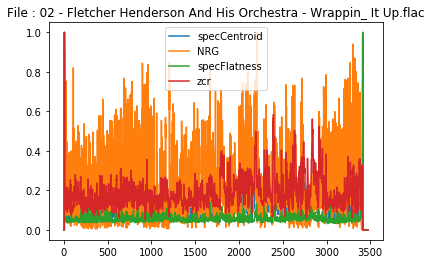

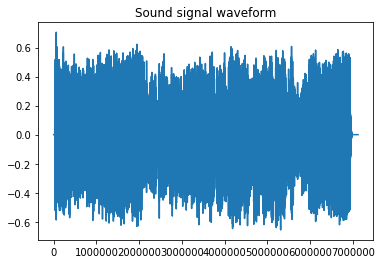

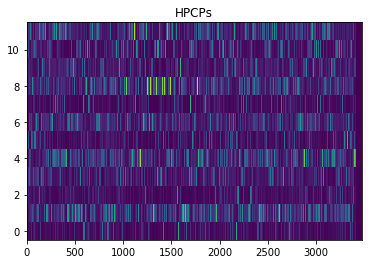

In [122]:
#Reading the data of the last file
with open(outputDir+'extractedfeatures.pkl', 'rb') as f:
    instFiles=pickle.load(f)
    
#Low-level features
plt.title('File : '+instFiles['name'])
plt.plot(instFiles['specCentroid'],label='specCentroid')
plt.plot(instFiles['NRG'],label='NRG')
plt.plot(instFiles['specFlatness'],label='specFlatness')
plt.plot(instFiles['zcr'],label='zcr')
plt.legend(loc='best')
plt.show()

#Sound signal waveform
x = ess.MonoLoader(filename = filepath, sampleRate = params.fs)()
plt.plot(x)
plt.title('Sound signal waveform')
plt.show()

#Chroma features
hpcp = instFiles['hpcp'].T
plt.imshow(hpcp, aspect = 'auto', origin='lower', interpolation='none')
plt.title("HPCPs")
plt.show()

#Audio player
ipd.Audio(x, rate=params.fs)


####  Read predicted annotations (.lab format)

In [5]:
#Actual data analysis starts here

#Print sample annotation file content from an example
HTML(previewJSONFile(predictDir + 'wrappin_it_up_beats.lab'))

#### Read reference annotations (.lab format)

In [124]:
#Actual data analysis starts here
refDir='annotations/reference/'

#Print sample annotation file content from an example
HTML(previewJSONFile(refDir + 'wrappin_it_up.lab'))

#### Define MIReval functions

In [1]:
import mir_eval

def createEvalJSON(evalData,evalDir):
    '''Create JSON file
    Parameters
    ----------
    evalData : dict
        Dictionary containing all info and data for the file
    evalDir : str
        Directory of the json evaluation file
    Creates
    -------
    mir_eval json file
    '''

    with open(evalDir+'mir_eval.json' , 'w') as m:
        json.dump(evalData, m)
        
        
def mirEval(listFiles,evalDir):
    '''Computation of mean scores from the mir evaluation
    Parameters
    ----------
    fileData : dict
        Dictionary containing all info and data for the file
    evalDir : str
        Directory of the json evaluation file
    
    Returns
    -------
    mirEvalEssentia : float
        mean score from the Essentia's chordDetection algorithm
    mirEvalEssentiaBeats : float
        mean score from the Essentia's chordDetectionBeats algorithm
    mirEvalMadmom : float
        mean score from the Madmom's CNN+CNF algorithm
    '''
    
    evalchordEssentia=[]
    evalchordEssentiaBeats=[]
    evalMadmom=[]
    
    
    with open(evalDir+'mir_eval.json' , 'r') as mr:
        evalData=json.load(mr)

    for file in listFiles:
        evalchordEssentia.append(evalData[file]['chordEssentia'])
        evalchordEssentiaBeats.append(evalData[file]['chordEssentiaBeats'])
        evalMadmom.append(evalData[file]['chordMadmom'])
    
    
    evalchordEssentia=np.array(evalchordEssentia)
    evalchordEssentiaBeats=np.array(evalchordEssentiaBeats)
    evalMadmom=np.array(evalMadmom)

    mirEvalEssentia=np.mean(evalchordEssentia)
    mirEvalEssentiaBeats=np.mean(evalchordEssentiaBeats)
    mirEvalMadmom=np.mean(evalMadmom)

    return mirEvalEssentia, mirEvalEssentiaBeats, mirEvalMadmom



#### Running Mir Evaluation and output mean scores

In [4]:
# HERE YOU CAN CHOOSE THE PARAMETERS AND DIRECTORIES YOU WANT 

refDir='annotations/reference/'
predictDir='annotations/predicted/'
evalDir='annotations/evaluation/'

filetype='.lab'

listPredictFiles=[]
listFiles=[]

evalData=dict();


#Create a list with all the predicted files
for root, dirs, files in os.walk(predictDir):
    for file in files:
        if file.endswith(filetype):
            listPredictFiles.append(file)


for root, dirs, files in os.walk(refDir):
    for file in files:
        if file.endswith(filetype):
            if file in listPredictFiles:
                name=file.replace(filetype,'')
                
                #run mir evaluation if the file appears in predicted files
                (ref_intervals,ref_labels) = mir_eval.io.load_labeled_intervals(refDir+file)
                (evalDetec_intervals,evalDetec_labels) = mir_eval.io.load_labeled_intervals(predictDir+file)
                (evalDetecBeats_intervals,evalDetecBeats_labels) = mir_eval.io.load_labeled_intervals(predictDir+name+'_beats'+filetype)
                (evalDetecMadmom_intervals,evalDetecMadmom_labels) = mir_eval.io.load_labeled_intervals(predictDir+name+'_madmom'+filetype)
                
                evalDetecScores = mir_eval.chord.evaluate(ref_intervals, ref_labels, evalDetec_intervals, evalDetec_labels)
                chorDetecScores= evalDetecScores['mirex']
                
                evalDetecBeatScores = mir_eval.chord.evaluate(ref_intervals, ref_labels, evalDetecBeats_intervals, evalDetecBeats_labels)
                chorDetecBeatScores= evalDetecBeatScores['mirex']
                
                evalMadmomScores =  mir_eval.chord.evaluate(ref_intervals, ref_labels, evalDetecMadmom_intervals, evalDetecMadmom_labels)
                chorMadmomScores= evalMadmomScores['mirex']
                
                evalData[file]={}
                evalData[file]['chordEssentia']=chorDetecScores
                evalData[file]['chordEssentiaBeats']=chorDetecBeatScores
                evalData[file]['chordMadmom']=chorMadmomScores
                
                listFiles.append(file)
                
            else:
                print(file+' did not appear in the predicted list')
                
#Saving all results in json file
createEvalJSON(evalData,evalDir)

#run mean scores from the algorithms evaluation
EssentiaCDEval, EssentiaCDBEval, MadmomEval = mirEval(listFiles,evalDir)
EssentiaCDEval, EssentiaCDBEval, MadmomEval = round(EssentiaCDEval,2), round(EssentiaCDBEval,2), round(MadmomEval,2)

print('\n')
print('The scores of the evaluation are: {0} for ChordDetection, {1} for chordDetectionBeats and {2} for Madmom.'.format(EssentiaCDEval, EssentiaCDBEval, MadmomEval))

                

big_butter_and_eggman.lab did not appear in the predicted list
blues_for_alice.lab did not appear in the predicted list
body_and_soul(goodman).lab did not appear in the predicted list
body_and_soul(hawkins).lab did not appear in the predicted list
cotton_tail_fitzgerald.lab did not appear in the predicted list
diminuendo_and_crescendo_in_blue.lab did not appear in the predicted list
dinah_fats_waller.lab did not appear in the predicted list
dinah_red_nichols.lab did not appear in the predicted list
east_st_louis.lab did not appear in the predicted list
girl_from_ipanema.lab did not appear in the predicted list
handful_of_riffs.lab did not appear in the predicted list
he_s_funny_that_way.lab did not appear in the predicted list
honky_tonk_train.lab did not appear in the predicted list
i_cant_believe_you_are_in_love_with_me.lab did not appear in the predicted list
ko-ko(ellington).lab did not appear in the predicted list
maple_leaf_rag(bechet).lab did not appear in the predicted list
map